In [80]:
%%capture
!pip install yfinance
!pip install pytorch-lightning
!pip install scikit-plot

In [81]:
import pytorch_lightning as pl

In [82]:
import yfinance as yf
import pandas as pd
import pandas as pd
import numpy as np
import scipy.stats as st
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
import torch
import random

In [135]:
# import standard PyTorch modules
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader

# import torchvision module to handle image manipulation
import torchvision
import torchvision.transforms as transforms

# to show images
import numpy as np
import matplotlib.pyplot as plt

# to create neural network
import pdb
import pytorch_lightning as pl 

# to show the matrix 
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import scikitplot as skplt

# to do data augmentation
import PIL

from IPython.display import display, Image

## I - Import et preprocessing des donnees

Pour commencer, nous importons des donnees du S&P 500 et du VIX a partir de Yahoo Finance. Ces donnees sont intraday. Nous aurions prefere avoir des donnees au cours d une journee pour observer les mouvements avant le close mais elles n etaient pas disponibles. Heureusement, Yahho finance fournit l open, le close, le minimum et le maximum de la journee.

Nous avons choisi le VIX en plus du S&P 500 car, representant la volatilite estimee de l'indice, il donne beaucoup d information a son sujet

In [106]:
import yfinance as yf
start_date_df = '2005-01-31'
end_date_df = '2021-01-31'
SP500_df = yf.download('^GSPC', start=start_date_df, end=end_date_df, progress=False)
VIX_df = yf.download('^VIX', start=start_date_df, end=end_date_df, progress=False)

### Feature Engineering

Dans le but de tirer le maximum d information de nos donnees, nous avons voulu calculer le maximum de metriques possibles.
Ainsi, nous avons rajoute au dataset les colonnes suivantes :

* les retours absolus d un jour a l autre
* les retours en pourcentage
* la standard deviation  sur une base de 10, 40 et 100 jours
* la moyenne normale et croisee sur des bases de 5, 20 , 25 et 99 jours

In [107]:
# Columns 
SP_base_colums = ['Open', 'High', 'Low', 'Close', 'Volume']  #Adj Close ?
VIX_base_colums = ['Open', 'High', 'Low', 'Close']  #Adj Close ?
SP500_df = SP500_df[SP_base_colums].copy()
VIX_df = VIX_df[VIX_base_colums].copy()

# Returns
def get_returns(df, col):
    df[col + '_return'] = df[col] - df[col].shift(1)
    return df

###############
list_SP_returns_columns = SP_base_colums # CHOOSE COLUMNS TO GET RETURNS
for col in list_SP_returns_columns:
    SP500_df = get_returns(SP500_df, col)

list_VIX_returns_columns = VIX_base_colums # CHOOSE COLUMNS TO GET RETURNS
for col in list_VIX_returns_columns:
    VIX_df = get_returns(VIX_df, col)
###############





# percent changes
def get_percent_changes(df, col):
    df[col + '_percent'] = df[col + '_return']/df[col].shift(1)
    return df

###############
list_SP_percent_columns = SP_base_colums # CHOOSE COLUMNS TO GET PERCENT
for col in list_SP_percent_columns:
    SP500_df = get_percent_changes(SP500_df, col)
    
list_VIX_percent_columns = VIX_base_colums # CHOOSE COLUMNS TO GET PERCENT
for col in list_VIX_percent_columns:
    VIX_df = get_percent_changes(VIX_df, col)
###############





# Vars
def compute_MVar(df, t_list, col):
    for t in t_list:
        df['MVar_'+str(t)] = df[col].rolling(t).std()   
    return df

###############
t_list = [10, 40, 100] # temporal window size

list_SP_vol_columns = SP_base_colums # CHOOSE COLUMNS TO GET VOL
for col in list_SP_vol_columns:
    SP500_df = compute_MVar(SP500_df, t_list, col)

list_VIX_vol_columns = VIX_base_colums # CHOOSE COLUMNS TO GET VOL
for col in list_VIX_vol_columns:
    VIX_df = compute_MVar(VIX_df, t_list, col)
###############



# MAs
def compute_MA(df, MA_list, col):
    for N in MA_list:
      df['MA'+str(N)] = df[col].rolling(N).mean()   
    return df

def crossing_moving_average(df, A, B):
    df['MA'+str(A)+'>MA'+str(B)] =(df['MA'+str(A)] - df['MA'+str(B)])
    return df

def compute_crossing_MA(df, MA_list):
  couples_MA = list(combinations(MA_list, 2))
  for couple in couples_MA:
      df = crossing_moving_average(df, couple[0], couple[1])   
      #df = crossing_moving_average(df, couple[1], couple[0]) 
  return df  

def compute_percent_to_MA(df, MA_list, col):
    for N in MA_list:
        df['percent_to_MA'+str(N)] = (df[col] - df['MA'+str(N)])/df[col]
    return df



def compute_MA_metrics(df, A_range, B_range, col):
    MA_list = list(set(A_range + B_range))
    df = compute_MA(df, MA_list, col)
    df = compute_crossing_MA(df, MA_list)
    df = compute_percent_to_MA(df, MA_list, col)
    return df






###############
list_col_to_MAs = ['Close'] # # CHOOSE COLUMNS TO GET MAS METRICS
MA_list = [5, 10, 25, 99]
A_range, B_range = MA_list, MA_list
for col in list_col_to_MAs:
    SP500_df = compute_MA_metrics(SP500_df, A_range, B_range, col)
    #VIX_df = compute_MA_metrics(VIX_df, A_range, B_range, col)  
###############

# AUTRES... expo moving average ?
'''
def compute_Mminmax(df, t_list, price_choice):
    # choice : Open - High - Low - Close - Adj Close - Volume
    for t in t_list:
        df['Mmin_'+str(t)] = df[price_choice].rolling(t).min()
        df['Mmax_'+str(t)] = df[price_choice].rolling(t).max()
    return df
'''

"\ndef compute_Mminmax(df, t_list, price_choice):\n    # choice : Open - High - Low - Close - Adj Close - Volume\n    for t in t_list:\n        df['Mmin_'+str(t)] = df[price_choice].rolling(t).min()\n        df['Mmax_'+str(t)] = df[price_choice].rolling(t).max()\n    return df\n"

Nous enlevons toutes les donnees qui ne nous servirons pas car manquant d au moins d une valeur.

In [108]:
SP500_df=SP500_df.dropna()
VIX_df=VIX_df.dropna()

### Preprocessing

Ensuite, nous renommons les colonnes afin de pouvoir reunir les deux datasets. Ils constitueront la base de nos donnees.

In [109]:
for key in VIX_df.keys() : VIX_df=VIX_df.rename(columns={key: "VIX" + key})

In [110]:
for key in SP500_df.keys() : SP500_df=SP500_df.rename(columns={key: "SP" + key})

In [111]:
full_data=pd.concat((SP500_df,VIX_df),axis=1, join="inner")

Normalize

A l origine, nous avions decide de normaliser le l enorme dataframe reunissant nos donnees journalieres puis de le diviser en couple (x,y). Toutefois, nous nous sommes rendu compte qu il faisait beaucoup plus sens de normaliser chacun de nos xi separement.

En effet, cette normalisation separee permet d observer des motifs similaires sur l historique recent des donnees independamment de la valeur de l'indice a ses moments la. Le S&P a eu tendance a croitre ces dernieres annees. Une normalisation de tout le dataset aurait cree de grandes differences entre les donnees recentes et les donnees anciennes. Ainsi, des motifs sur les variations de celles ci n auraient pas ete aussi identifiables que lors d une normalisation separee.

In [112]:
# Normalize
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(-1, 1))

def scale_this_data(data):
    for col in data.columns:
        data[col] = scaler.fit_transform(data[col].values.reshape(-1,1))
    return data


## II - La separation des donnees en x et en y

Afin d obtenir des paires (x,y). Nous avons construit le vecteur y a partir de nos donnees. Nous avons decide de construire un vecteur binaire dont les valeurs sont egales a 1 lorsque le S&P a augmente au close entre deux dates. Elles valent 0 dans le cas contraire. 

Le choix de 0 et 1 s'est fait dans le but d'utiliser la Binary Cross Entropy loss.

Ensuite, nous avons construit les xi avec la methode rolling et en les convertissant en tenseurs. Nous avons choisi le format float32 pour faciliter la compatibilite avec les differentes features utilisees dans nos reseaux.

In [113]:
def input_to_output_data(full_data,size_window):
  data=full_data["SPClose"].reset_index().copy() #.copy() ou travaille directement sur full_data

  # elements are changed one by one starting at the end
  for row in range(len(data["SPClose"])-1,0,-1) :
    ''' 
    if data["SPClose"][row]>=data["SPClose"][row-1] : # iloc
      data["SPClose"][row]=1
    else : data["SPClose"][row] = -1
    '''
    if data.loc[data.index[row], "SPClose"]>=data.loc[data.index[row-1], "SPClose"] : # iloc
      data.loc[data.index[row], "SPClose"]=1
    else : data.loc[data.index[row], "SPClose"] = 0
  # first elements are not useful  
  data=data.drop(data.index[0:size_window]) 
  data=data.set_index("Date")
  return data

def two_datasets_to_x_y(data_x, data_y,size_window):
    list_of_x_y=[]

    # i th element in y
    index_i=0

    # last row of input is not used as there is no y fo it
    data_x=data_x.drop(data_x.tail(1).index) 


    for xi in data_x.rolling(size_window) :
      if len(xi)==size_window :
        xi=scale_this_data(xi)
        list_of_x_y.append((torch.tensor([xi.values]).to(dtype=torch.float32),torch.tensor(data_y["SPClose"][index_i]).to(dtype=torch.float32))) #.to(dtype=torch.float32)
        index_i+=1
    return list_of_x_y    

In [114]:
output_data=input_to_output_data(full_data,20)

In [ ]:
x_y=two_datasets_to_x_y(full_data, output_data,20)

In [125]:
x_y[0][0].size()# TRANSPOSE ??

torch.Size([1, 20, 47])

Nous procedons ensuite a une separation de nos donnees en deux parties. La partie training et la partie validation.

In [119]:
random.shuffle(x_y)

In [120]:
stop=int(0.9*len(x_y))

In [121]:
train=x_y[0:stop]

In [126]:
valid=x_y[stop+1:]

## III - L'entrainement du Convolutional Neural Network

In [ ]:
%load_ext tensorboard
%tensorboard --logdir lightning_logs/ --host 0.0.0.0 --port 6006

!curl -s http://localhost:4040/api/tunnels | python3 -c \
    "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"

Dans cette partie, nous avons construit un Convolutional Neural Network. Un de nos buts, dans ce projet, est de voir s'il existe des motifs dans l historique de donnees qui precedent une hausse de l'indice. 

Le reseau de neurones parfait pour ce type d'etude nous a semble etre le CNN. Ce reseau est souvent utilise pour la reconnaissance de motifs dans les images. Nous avons donc voulu voir ce qu il donnerait dans le cas 1D de series temporelles.

Finalement, ce cas n est pas vraiment un reseau 1D. Le fait que nous ayons plusieurs donnees differentes dans l'historique nous pousse a creer une convolution 2D en premiere etape. Ensuite, nous passons a des couches 1D.

In [127]:
class SP_VIX_CNN(pl.LightningModule):
    
    def __init__(self):
        super(SP_VIX_CNN, self).__init__()
        
        # First convolutional block
        # 28x28 vers 28x28 vers 14x14
        self.conv_block1 = nn.Sequential(
            #nn.Conv1d(in_channels=1, out_channels=128, kernel_size=(4,43),padding=(0,0)), 
            #input size conv1d (batch size, number of channels, length of signal sequence)
            nn.Conv2d(in_channels=1, out_channels=256, kernel_size=(9,47),padding=(0,0)), 
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=(2,1), stride=1),
            torch.nn.Dropout(p=0.3, inplace=False)
        )
        
        # Second convolutional block
        # 14x14 vers 14x14 vers 7x7
        self.conv_block2 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=(4,1)),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            #nn.MaxPool2d(kernel_size=(3,1), stride=1),
            torch.nn.Dropout(p=0.3, inplace=False)
        )
        self.conv_block3 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=1028, kernel_size=(3,1)),
            nn.BatchNorm2d(1028),
            nn.ReLU(),
            #nn.MaxPool2d(kernel_size=2, stride=2),
            torch.nn.Dropout(p=0.3, inplace=False)
        )


        # Fully connected layers
        # 256 elmts de taille 1x1 => vecteur de 256 elmts
        self.fc1 = nn.Linear(in_features=6168, out_features=512)
        self.act= nn.ReLU()
        # devrait etre dropout simple car 1d
        self.drop = nn.Dropout2d(0.25)
        self.fc2 = nn.Linear(in_features=512, out_features=1)
    
        self.ce=nn.BCEWithLogitsLoss()
        self.accuracy = pl.metrics.Accuracy()

    def encoder(self, x):
        #pdb.set_trace()
        out = self.conv_block1(x)
        out = self.conv_block2(out)
        out = self.conv_block3(out)
        return out.view(out.size(0), -1)

    def classifier(self, x):
        # import pdb; pdb.set_trace()
        out = self.fc1(x)
        out=self.act(out)
        #out = self.drop(out)
        out = self.fc2(out)
        return out

    def forward(self, x):
        #pdb.set_trace()
        features = self.encoder(x)
        logits = self.classifier(features)
        return logits

    def _step_util(self, batch, batch_idx, step_type):
        #pdb.set_trace()
        x, y = batch
        #y = y.reshape(512) # 64 -> self.batch_size
        logits=self(x).reshape(len(y))
        #logits=torch.sigmoid(logits)
        #loss = F.cross_entropy(logits, y)
        loss = self.ce(logits, y) #F.cross_entropy(logits, y)
        acc = self.accuracy(torch.sigmoid(logits), y.to(torch.int8)) #self.accuracy(F.softmax(logits, dim=1), y)
        self.log(step_type + "_loss", loss, on_step=True, on_epoch=True, prog_bar=False, logger=True)
        self.log(step_type + "_acc", acc, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def training_step(self, batch, batch_idx):
        #pdb.set_trace()
        return self._step_util(batch, batch_idx, "train")

    def validation_step(self, batch, batch_idx):
        return self._step_util(batch, batch_idx, "valid")

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=1e-8)

In [128]:
num_workers=1
train_loader_final = DataLoader(train, batch_size=64, num_workers=num_workers, shuffle=True)
valid_loader_final = DataLoader(valid, batch_size=256, num_workers=num_workers)

In [129]:
model = SP_VIX_CNN()
trainer_final = pl.Trainer(gpus=1, max_epochs=1000, progress_bar_refresh_rate=20)
trainer_final.fit(model, train_dataloader=train_loader_final, val_dataloaders=valid_loader_final)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name        | Type              | Params
--------------------------------------------------
0 | conv_block1 | Sequential        | 109 K 
1 | conv_block2 | Sequential        | 525 K 
2 | conv_block3 | Sequential        | 1.6 M 
3 | fc1         | Linear            | 3.2 M 
4 | act         | ReLU              | 0     
5 | drop        | Dropout2d         | 0     
6 | fc2         | Linear            | 513   
7 | ce          | BCEWithLogitsLoss | 0     
8 | accuracy    | Accuracy          | 0     
--------------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.504    Total estimated model params size (MB)


1

Nous avons ete decus de ne pas avoir reussi a obtenir une meilleure accuracy que 0.55. Nous savions, a partir de nos lectures, qu'il existait comme un plafond de verre au niveau des 0.57 mais nous esperions pouvoir faire autant voire mieux.

Il fait sens que de tels motifs sont tres durs a reperer. Sur un indice aussi liquide que le S&P 500, s'il existait des opportunites a fortes probabilites de gains, elles seraient tres vite exercees. Il ne fait aucun doute que de nombreuses firmes s'interessent a de telles opportunites sur cet indice. 

Voici, ci dessous, des exemples d Accuracy/Loss que nous avons obtenus. Nous avons l'impression que le reseau s'ameliore legeremment au cours de l'apprentissage. Nous avons bien fait attention a ce qu'apres l'apprentissage, il ne predise pas la meme classe pour toutes les donnes. Dans ce cas, notre acuracy n'aurait ete que la proportion de cette classe dans le set de validation. Heureusement, ce n'est pas le cas.

In [141]:

train_iter_final = iter(train_loader_final)
first = next(train_iter_final)

In [143]:
model.predict(first[0], batch_idx=64)

tensor([[ 0.1542],
        [ 0.0688],
        [ 0.1264],
        [ 0.1723],
        [ 0.1302],
        [ 0.2737],
        [ 0.1995],
        [ 0.1138],
        [ 0.1247],
        [ 0.2294],
        [-0.1118],
        [ 0.2439],
        [ 0.1910],
        [ 0.5128],
        [ 0.2275],
        [ 0.3411],
        [ 0.5568],
        [ 0.0530],
        [ 0.1730],
        [ 0.4350],
        [-0.0615],
        [ 0.4075],
        [ 0.0106],
        [ 0.1148],
        [-0.1486],
        [ 0.4057],
        [ 0.1483],
        [ 0.0948],
        [ 0.2011],
        [ 0.5390],
        [ 0.3006],
        [ 0.4512],
        [-0.0265],
        [ 0.0042],
        [ 0.1316],
        [ 0.0219],
        [-0.2133],
        [ 0.3119],
        [ 0.2691],
        [ 0.2312],
        [ 0.3102],
        [ 0.3812],
        [ 0.0751],
        [ 0.2804],
        [ 0.4972],
        [ 0.0053],
        [ 0.1077],
        [ 0.1231],
        [ 0.0292],
        [ 0.2285],
        [ 0.2258],
        [ 0.2237],
        [ 0.

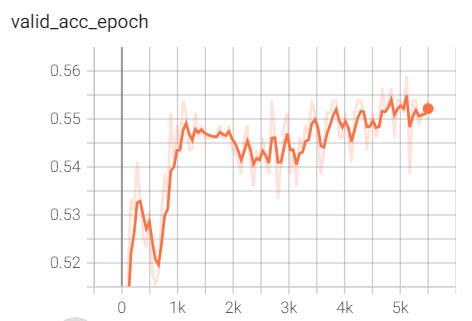

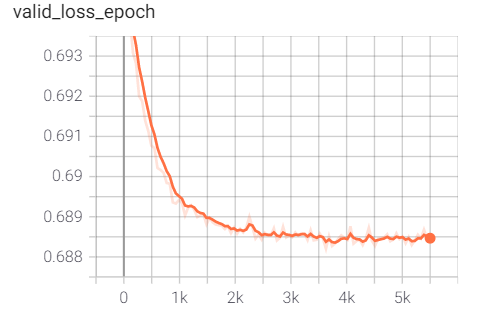

In [136]:

display(Image(filename='accuracy.PNG'))
display(Image(filename='loss.PNG'))

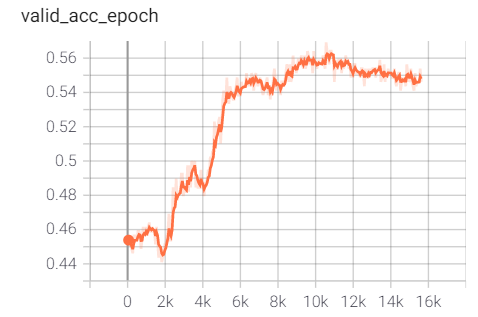

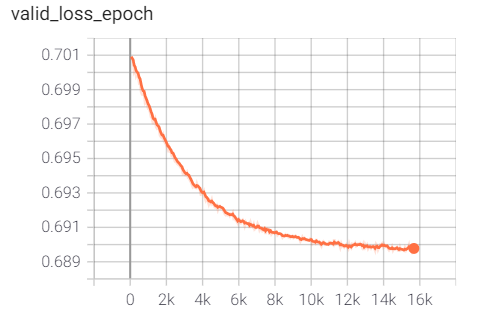

In [137]:

display(Image(filename='accuracy2.PNG'))
display(Image(filename='loss2.PNG'))

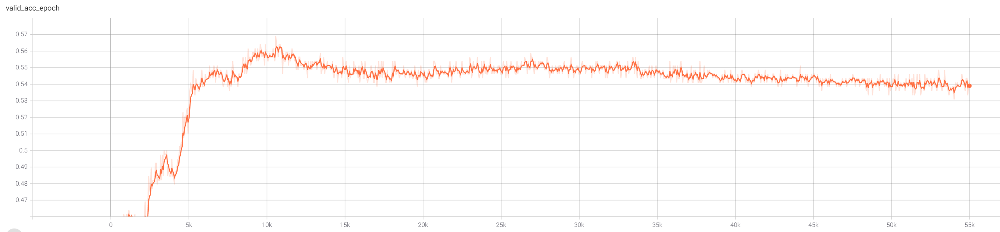

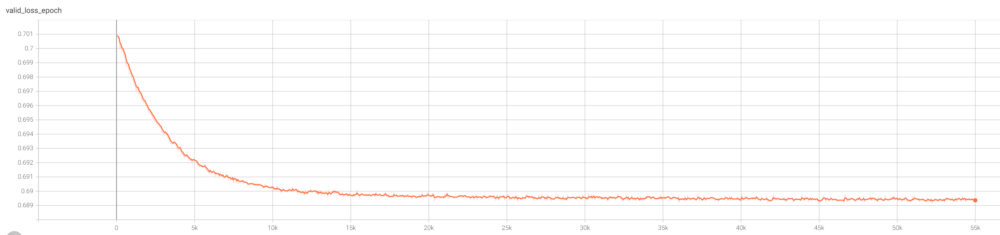

In [138]:

display(Image(filename='accuracy3.PNG'))
display(Image(filename='loss3.PNG'))

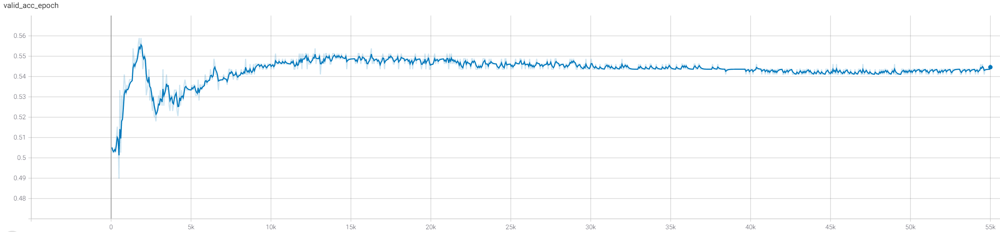

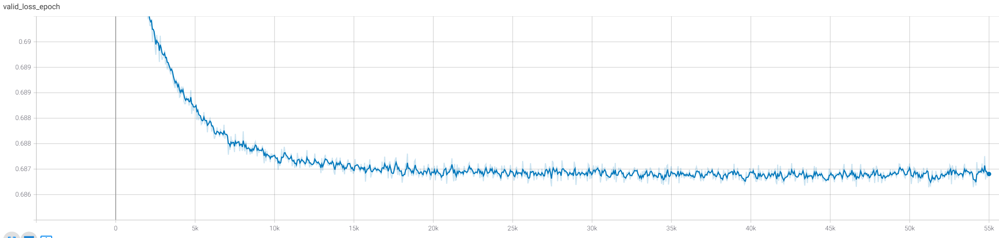

In [139]:

display(Image(filename='accuracy4.PNG'))
display(Image(filename='loss4.PNG'))